# Ross Ice Shelf gravity inversion

# Import packages

In [ ]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2
import logging
import os
import pathlib
import pickle
from pathlib import Path

import harmonica as hm
import numpy as np
import pandas as pd
import pygmt
import pyogrio
import verde as vd
import xarray as xr
import zarr
from polartoolkit import fetch, maps
from polartoolkit import utils as polar_utils
from scipy import stats

import RIS_gravity_inversion.utils as RIS_utils

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"
logging.getLogger().setLevel(logging.INFO)
from invert4geom import inversion, plotting, regional, utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Set region and parameters

In [192]:
starting_region = [-580e3, 420e3, -1420e3, -420e3]

inversion_region = starting_region
buffer_region = vd.pad_region(starting_region, 40e3)

# set layer parameters
layer_spacing = 10e3
registration = "g"

# set gravity observation parameters
grav_observation_height = 1e3
grav_spacing = 10e3

print(f"layer spacing: {layer_spacing}m")
print(f"registration: {registration}")
print("inversion region = ", inversion_region)
print("buffer region = ", buffer_region)

layer spacing: 10000.0m
registration: g
inversion region =  [-580000.0, 420000.0, -1420000.0, -420000.0]
buffer region =  (-620000.0, 460000.0, -1460000.0, -380000.0)


# Load data

## topographic layers
* Surface, Icebase, Bed

From notebook `prepare_grids`

In [193]:
# SURFACE
fname = "../../inversion_layers/bedmachine_surface.zarr"
# fname= "../../inversion_layers/bedmap2_surface.zarr"
surface_full = xr.open_zarr(fname).surface

# ICEBASE
fname = "../../inversion_layers/bedmachine_icebase.zarr"
# fname =  "../../inversion_layers/bedmap2_icebase.zarr"
icebase_full = xr.open_zarr(fname).icebase

# BED
fname = "../../inversion_layers/bedmachine_bed.zarr"
bedmachine_bed_full = xr.open_zarr(fname).bed

fname = "../../inversion_layers/bedmap2_bed.zarr"
bedmap_bed_full = xr.open_zarr(fname).bed

# starting bed
# fname = "../../inversion_layers/bed_from_constraints_verde_spline.zarr"
# fname = "../../inversion_layers/bed_from_constraints_gmt_surface.zarr"
# starting_bed_full = xr.open_zarr(fname).bed

# fname = "../../inversion_layers/RIS_starting_bed_stats.zarr"
# starting_bed_full = xr.open_zarr(fname).weighted_mean

# BASEMENT
# Ross Embayment basement merged to bedmachine bed
# basement = "../../inversion_layers/bed_basement_merged.zarr"
# Ross Embayment basement merged to ANTASed basement
# basement = "../../inversion_layers/ANTASed_magnetics_merged_basement.zarr"
# basement = xr.open_zarr(basement).basement

grids = [
    surface_full,
    icebase_full,
    # starting_bed_full,
    bedmap_bed_full,
    bedmachine_bed_full,
]

for g in grids:
    print(polar_utils.get_grid_info(g))

(1000.0, (-960000.0, 800000.0, -1800000.0, -60000.0), -66.0, 4342.67675781, 'g')
(1000.0, (-960000.0, 800000.0, -1800000.0, -60000.0), -3299.34741211, 4342.60839844, 'g')
(1000.0, (-960000.0, 800000.0, -1800000.0, -60000.0), -5162.05029297, 3722.66943359, 'g')
(1000.0, (-960000.0, 800000.0, -1800000.0, -60000.0), -4501.86767578, 4342.60839844, 'g')


### resample to same spacing / region

In [194]:
surface = fetch.resample_grid(
    surface_full,
    spacing=layer_spacing,
    region=buffer_region,
    registration=registration,
    verbose="q",
).rename({"x": "easting", "y": "northing"})
icebase = fetch.resample_grid(
    icebase_full,
    spacing=layer_spacing,
    region=buffer_region,
    registration=registration,
    verbose="q",
).rename({"x": "easting", "y": "northing"})
# starting_bed = fetch.resample_grid(
#     starting_bed_full,
#     spacing=layer_spacing,
#     region=buffer_region,
#     registration=registration,
#     verbose="q",
# ).rename({"x": "easting", "y": "northing"})
bedmap_bed = fetch.resample_grid(
    bedmap_bed_full,
    spacing=layer_spacing,
    region=buffer_region,
    registration=registration,
    verbose="q",
).rename({"x": "easting", "y": "northing"})
bedmachine_bed = fetch.resample_grid(
    bedmachine_bed_full,
    spacing=layer_spacing,
    region=buffer_region,
    registration=registration,
    verbose="q",
).rename({"x": "easting", "y": "northing"})

# ensure layers never cross
icebase = xr.where(icebase > surface, surface, icebase)
# starting_bed = xr.where(
#     starting_bed > icebase,
#     icebase,
#     starting_bed,
# )

grids = [
    surface,
    icebase,
    # starting_bed,
    bedmap_bed,
    bedmachine_bed,
]

for g in grids:
    print(polar_utils.get_grid_info(g))

(10000.0, (-620000.0, 460000.0, -1460000.0, -380000.0), -61.0, 3835.59863281, 'g')
(10000.0, (-620000.0, 460000.0, -1460000.0, -380000.0), -2736.2121582, 3831.45800781, 'g')
(10000.0, (-620000.0, 460000.0, -1460000.0, -380000.0), -3976.22021484, 3148.73095703, 'g')
(10000.0, (-620000.0, 460000.0, -1460000.0, -380000.0), -3671.7800293, 3831.45800781, 'g')


## bed constraints
from notebook `RIS_bathymetry_data.ipynb`

In [195]:
constraints_fname = "../../data/bed_constraints.csv.gz"

constraints = pd.read_csv(
    constraints_fname,
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# ensure all points are within buffer region
constraints = polar_utils.points_inside_region(
    constraints,
    # buffer_region,
    inversion_region,
    names=("easting", "northing"),
)

print(f"bathymetry control points:{len(constraints)}")
constraints  # .describe()

bathymetry control points:21404


,northing,easting,upward,inside,uncert,weights
1744,-1.420000e+06,-580000.000000,-3480.743652,False,10.000000,0.010000
1745,-1.420000e+06,-575000.000000,-3485.402344,False,10.000000,0.010000
1746,-1.420000e+06,-570000.000000,-3478.737793,False,10.000000,0.010000
1747,-1.420000e+06,-565000.000000,-3474.053955,False,10.000000,0.010000
1748,-1.420000e+06,-560000.000000,-3444.883789,False,10.000000,0.010000
...,...,...,...,...,...,...
28082,-8.164639e+05,-218050.118799,-564.000000,True,28.163959,0.001261
28083,-1.087485e+06,-452466.872984,-714.000000,True,35.974822,0.000773
28084,-1.033177e+06,-214445.845201,-512.000000,True,25.265698,0.001567
28085,-8.266453e+05,-197189.312136,-583.000000,True,29.301911,0.001165


In [196]:
print("Number of constraints inside RIS:", len(constraints[constraints.inside]))

Number of constraints inside RIS: 223


## starting topography

In [198]:
RIS_outline = pyogrio.read_dataframe("../../plotting/RIS_outline.shp")

,northing,easting,upward,uncert,weights
count,1.239000e+03,1239.000000,1239.000000,1239.000000,1239.000000
mean,-9.510330e+05,-105679.697249,-316.378300,14.222758,0.008392
std,2.591062e+05,305947.300045,604.223348,9.664580,0.003442
min,-1.370000e+06,-610000.000000,-2138.480469,10.000000,0.000205
25%,-1.181391e+06,-370000.000000,-697.500000,10.000000,0.010000
50%,-9.700000e+05,-163351.190328,-524.000000,10.000000,0.010000
75%,-7.300000e+05,180000.000000,-196.447731,10.000000,0.010000
max,-4.200000e+05,410000.000000,2494.372559,69.763951,0.010000


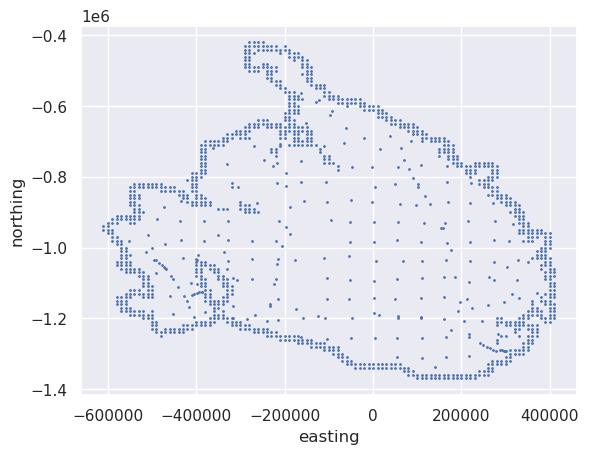

In [203]:
# get buffered border and grid with inside RIS masked
buffer_points, _, bed_outside = RIS_utils.get_buffer_points(
    buffer_width=layer_spacing * 2,
    grid=bedmachine_bed,
    mask=RIS_outline,
    # plot = True,
)

# label outside points and set error
buffer_points["inside"] = False
buffer_points["uncert"] = 10

# merge buffer and inside points
buffer_and_inside_points = pd.concat((buffer_points, constraints[constraints.inside]))

# plot points
buffer_and_inside_points.plot.scatter(x="easting", y="northing", s=1)

# set weighting values
buffer_and_inside_points["weights"] = 1 / (buffer_and_inside_points.uncert**2)
buffer_and_inside_points.describe()

In [205]:
starting_bed = RIS_utils.create_starting_bed(
    buffer_and_inside_points=buffer_and_inside_points,
    masked_bed=bed_outside,
    region=buffer_region,
    spacing=layer_spacing,
    icebase=icebase,
    surface=surface,
    method="surface",
    tension=0.5,
)

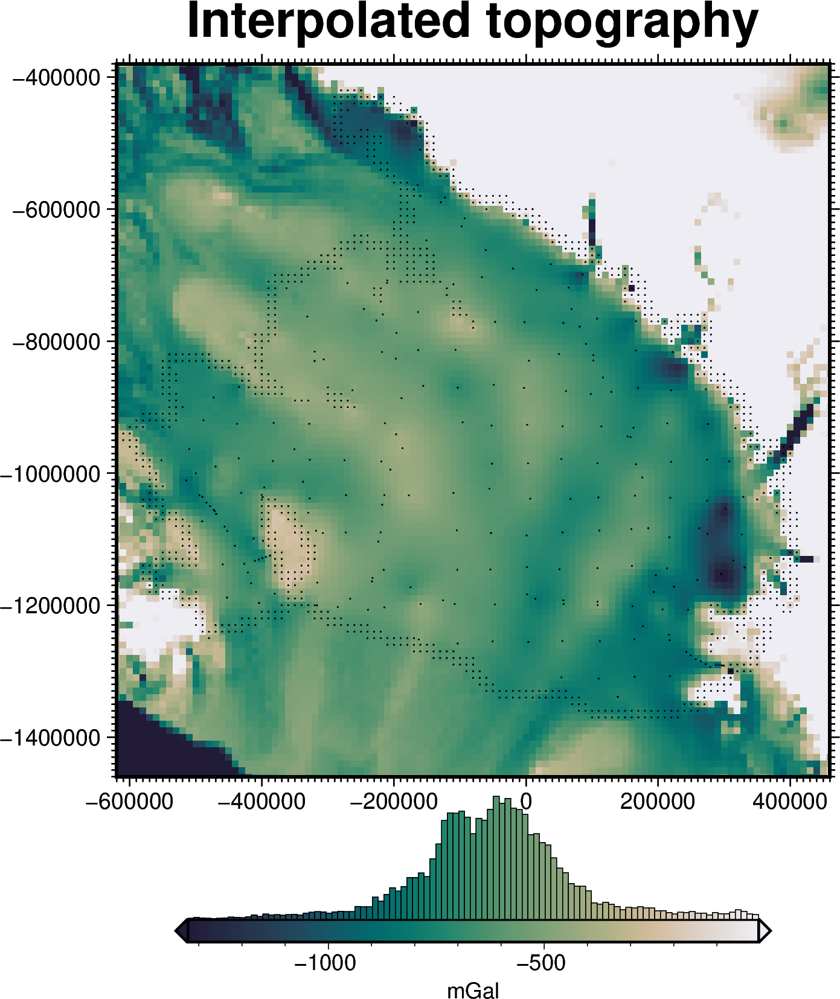

In [206]:
fig = maps.plot_grd(
    starting_bed,
    fig_height=10,
    title="Interpolated topography",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    hist=True,
    # robust=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    points=buffer_and_inside_points,
    points_style="p.02c",
    shp_mask=RIS_outline,
)
fig.show()

In [208]:
# sample the inverted topography at the constraint points
constraints = utils.sample_grids(
    constraints,
    starting_bed,
    "starting_bed",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraints.upward - constraints.starting_bed)
print(f"RMSE: {rmse:.2f} m")

RMSE: 111.78 m


## gravity data

partial_topo_corrected_disturbance: disturbance corrected for ice surface and water surface 
starting_bed_grav: forward gravity of starting bed
misfit: partial topo-corrected disturbance - starting bed grav
reg: regional component of misfit
res: residual component of misfit

In [78]:
# grav_df = pd.read_csv(
#     "../../data/RIS_topo_corrections_levelled_mean_bed.csv.gz",
#     # "../../data/RIS_topo_corrections_levelled_verde_spline.csv.gz",
#     # "../../data/RIS_topo_corrections_levelled_gmt_surface.csv.gz",
#     sep=",",
#     header="infer",
#     index_col=None,
#     compression="gzip",
# )

# grav_df = grav_df[~grav_df.test].drop(columns=["test"])

# grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# grav_grid = grav_grid.coarsen(
#     easting=2, northing=2, boundary="trim"
# ).mean()

# grav_df = grav_grid.to_dataframe().reset_index()

# grav_df = grav_df.dropna(subset=["res"])
# grav_grid.res.plot()
# grav_df

In [ ]:
rosetta_levelled = pd.read_csv(
    "../../data/ROSETTA_2nd_order_levelled.csv.gz",  # up continued and levelled
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# rename second to last column to "disturbance"
col = list(rosetta_levelled.columns)[-2]
rosetta_levelled = rosetta_levelled.rename(columns={col: "disturbance"})

# drop unnecessary columns
cols_to_keep = ["disturbance", "easting", "northing", "line", "Height"]
rosetta_levelled = rosetta_levelled.filter(cols_to_keep)

rosetta_levelled = rosetta_levelled.dropna(subset="disturbance")
rosetta_levelled.describe()

,disturbance,easting,northing,line,Height
count,37818.000000,37818.000000,3.781800e+04,37818.000000,37818.0
mean,-40.588761,-86944.360281,-1.000040e+06,666.195224,1000.0
std,13.172524,211512.049830,1.972253e+05,266.652091,0.0
min,-318.472075,-571286.658609,-1.367282e+06,20.000000,1000.0
25%,-47.722887,-241595.908279,-1.160502e+06,470.000000,1000.0
50%,-40.647903,-80945.395470,-1.010418e+06,650.000000,1000.0
75%,-33.564054,73274.120527,-8.504439e+05,850.000000,1000.0
max,32.001236,371296.853790,-4.604545e+05,1140.000000,1000.0


(0.0, 4.0)

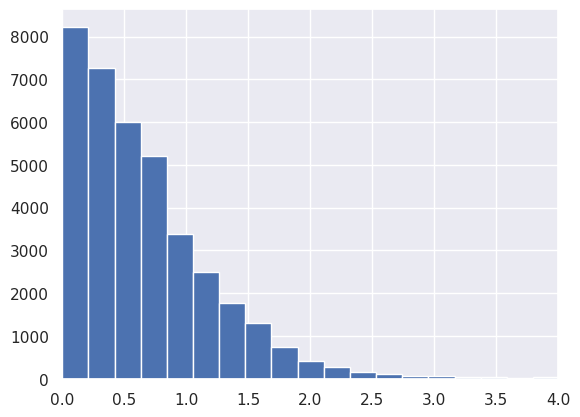

In [ ]:
rosetta_levelled["zscore"] = np.abs(stats.zscore(rosetta_levelled.disturbance))
rosetta_levelled = rosetta_levelled.sort_values(by="zscore", ascending=False)
ax = rosetta_levelled.zscore.hist(bins=100)
ax.set_xlim(0, 4)

Length of original data: 37818
Length of cleaned data: 37247


(0.0, 4.0)

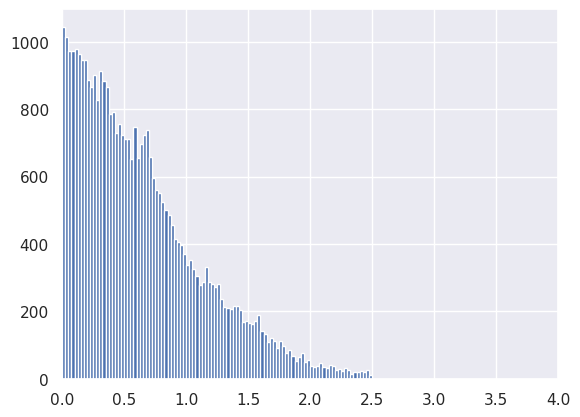

In [135]:
# dropped base on z-score
df_cleaned = rosetta_levelled[rosetta_levelled.zscore < 2.5].copy()
df_outliers = rosetta_levelled[rosetta_levelled.zscore >= 2.5].copy()

print("Length of original data:", len(rosetta_levelled))
print("Length of cleaned data:", len(df_cleaned))

ax = df_cleaned.zscore.hist(bins=100)
ax.set_xlim(0, 4)

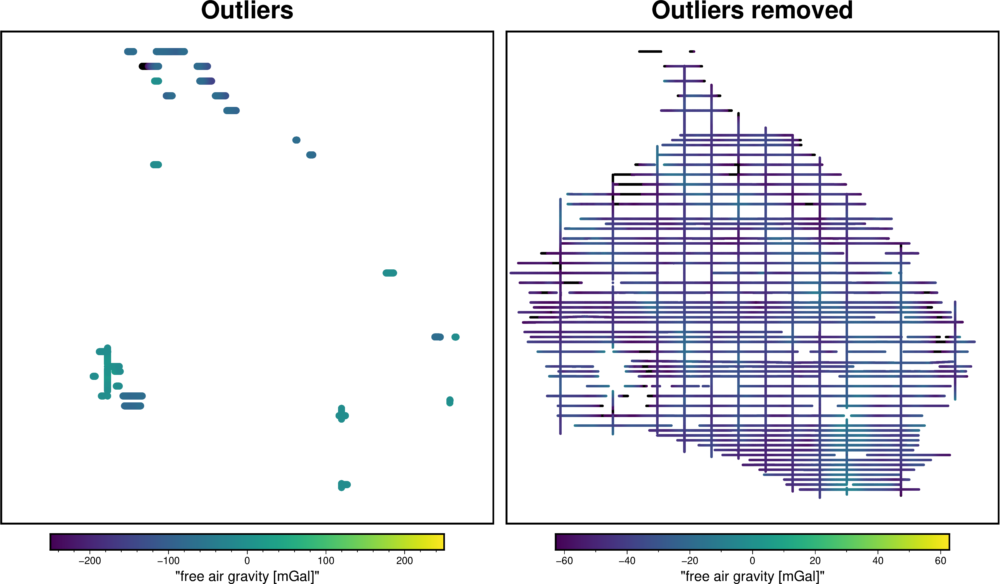

In [136]:
# plot a basemap
fig = maps.basemap(
    inversion_region,
    title="Outliers",
)

maxabs = max(np.abs(polar_utils.get_min_max(df_outliers.disturbance, robust=True)))
pygmt.makecpt(cmap="viridis", series=[-maxabs, maxabs])

# plot gravity data
fig.plot(
    x=df_outliers.easting,
    y=df_outliers.northing,
    fill=df_outliers.disturbance,
    style="c6p",
    cmap=True,
)

# plot the colorbar
fig.colorbar(frame='af+l"free air gravity [mGal]"')

# add a second figure to the right
fig = maps.basemap(
    inversion_region,
    title="Outliers removed",
    origin_shift="x",
    fig=fig,
)

# get a quarter of max absolute value and make a colorscale
maxabs = max(np.abs(polar_utils.get_min_max(df_cleaned.disturbance, robust=True)))
pygmt.makecpt(cmap="viridis", series=[-maxabs, maxabs])

# plot gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    fill=df_cleaned.disturbance,
    style="c2p",
    cmap=True,
)

# plot the colorbar
fig.colorbar(frame='af+l"free air gravity [mGal]"')

fig.show()

In [137]:
coords = (
    df_cleaned.easting,
    df_cleaned.northing,
    df_cleaned.Height,
)
data = df_cleaned.disturbance

eqs = hm.EquivalentSources(damping=100, depth="default", block_size=grav_spacing)
eqs.fit(coords, data)

EquivalentSources(block_size=10000.0, damping=100)

,northing,easting,upward,Gobs
count,4.775000e+03,4775.000000,4775.0,4775.000000
mean,-9.854743e+05,-65449.214660,1000.0,-41.248071
std,1.871830e+05,230055.735144,0.0,10.207995
min,-1.350000e+06,-580000.000000,1000.0,-68.845094
25%,-1.130000e+06,-240000.000000,1000.0,-47.972141
50%,-9.900000e+05,-60000.000000,1000.0,-41.184140
75%,-8.500000e+05,120000.000000,1000.0,-34.495961
max,-4.400000e+05,390000.000000,1000.0,-8.180000


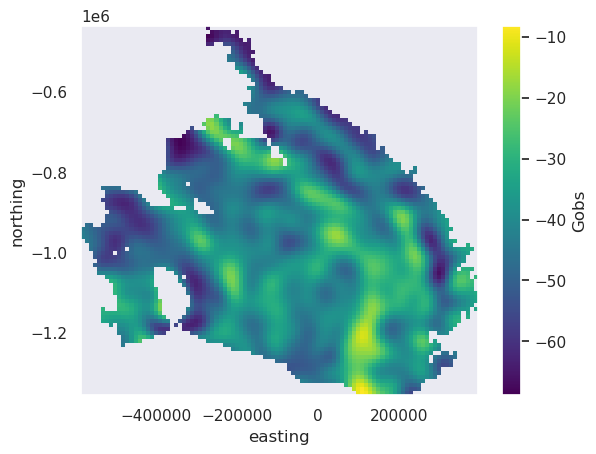

In [179]:
# Define grid coordinates
# region = vd.pad_region(vd.get_region(coords), 25e3)
grid_coords = vd.grid_coordinates(
    region=inversion_region,
    spacing=grav_spacing,
    pixel_register=False,
    extra_coords=1e3,  # upward continue to 1km
)

# grid the coordinates
observations = vd.make_xarray_grid(
    (grid_coords[0], grid_coords[1]),
    data=grid_coords[2],
    data_names="upward",
    dims=("northing", "easting"),
).upward

grav_df = vd.grid_to_table(observations)

grav_df["Gobs"] = eqs.predict((grav_df.easting, grav_df.northing, grav_df.upward))


# mask on distance to nearest data point
grav_df["masked"] = vd.distance_mask(
    (df_cleaned.easting, df_cleaned.northing),
    maxdist=grav_spacing * 4,
    coordinates=(grav_df.easting, grav_df.northing),
)
grav_df = grav_df[grav_df.masked].drop(columns="masked")

# mask with convex hull
# grav_df["masked"] = vd.convexhull_mask(
#     data_coordinates=(df_cleaned.easting, df_cleaned.northing),
#     coordinates=(grav_df.easting, grav_df.northing),
# )
# grav_df = grav_df[grav_df.masked].drop(columns="masked")

# subset gravity to just within ice shelf border
RIS_outline = pyogrio.read_dataframe("../../plotting/RIS_outline.shp")
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
# mask grav outside of RIS
grav_grid["inside"] = polar_utils.mask_from_shp(
    shapefile=RIS_outline,  # .buffer(10e3),
    xr_grid=grav_grid.Gobs,
    masked=False,
    invert=False,
)
grav_df = vd.grid_to_table(grav_grid)
grav_df = grav_df[grav_df.inside]

grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
grav_grid.Gobs.plot()

grav_df.describe()

In [139]:
# load gravity data
# grav_df = pd.read_csv(
#     "../../data/rosetta_eq_source_1k_levelled.csv.gz",
#     sep=",",
#     header="infer",
#     index_col=None,
#     compression="gzip",
# ).drop(columns=["inside"])

# grav_df = grav_df[~grav_df.test].drop(columns=["test"])
# grav_df = grav_df.dropna(subset=["Gobs"])
# grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
# grav_grid = grav_grid.coarsen(
#     easting=2, northing=2, boundary="trim"
# ).mean()
# grav_df = grav_grid.to_dataframe().reset_index()
# grav_grid.Gobs.plot()
# grav_df

In [209]:
# set densities
air_density = 1
ice_density = 915  # +/- 5, from Griggs and Bamber 2009/2011
water_density = 1024  # +/- 5, from Griggs and Bamber 2009/2011
sediment_density = 2300  # will likely change this

# ice prisms
density_contrast = ice_density - air_density
zref = 0
density_grid = xr.where(surface >= zref, density_contrast, -density_contrast)
ice_surface_prisms = utils.grids_to_prisms(
    surface,
    zref,
    density=density_grid,
)

# water prisms
density_contrast = water_density - ice_density
zref = 0
density_grid = xr.where(icebase >= zref, density_contrast, -density_contrast)
water_surface_prisms = utils.grids_to_prisms(
    icebase,
    zref,
    density=density_grid,
)

# sediment prisms
density_contrast = sediment_density - water_density
zref = 0
density_grid = xr.where(starting_bed >= zref, density_contrast, -density_contrast)
starting_bed_prisms = utils.grids_to_prisms(
    starting_bed,
    zref,
    density=density_grid,
)

In [210]:
# calculate forward gravity of prisms
grav_df["ice_surface_grav"] = ice_surface_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)
grav_df["water_surface_grav"] = water_surface_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)
grav_df["starting_gravity"] = starting_bed_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)
grav_df.describe()

  0%|          | 0/4775 [00:00<?, ?it/s]

  0%|          | 0/4775 [00:00<?, ?it/s]

  0%|          | 0/4775 [00:00<?, ?it/s]

,northing,easting,upward,Gobs,ice_surface_grav,water_surface_grav,starting_gravity,gravity_anomaly,misfit,reg,res
count,4.775000e+03,4775.000000,4775.0,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000
mean,-9.854743e+05,-65449.214660,1000.0,-41.248071,-0.162061,-1.888412,-34.183295,-39.197598,-5.014303,-6.044968,1.030666
std,1.871830e+05,230055.735144,0.0,10.207995,0.750251,0.575685,7.474220,10.270698,11.770247,11.432861,7.631777
min,-1.350000e+06,-580000.000000,1000.0,-68.845094,-2.118826,-4.721818,-67.243025,-70.596659,-66.305285,-42.228532,-27.496697
25%,-1.130000e+06,-240000.000000,1000.0,-47.972141,-0.562757,-2.118246,-38.304622,-45.881821,-12.804427,-13.455950,-3.421075
50%,-9.900000e+05,-60000.000000,1000.0,-41.184140,-0.362486,-1.738617,-33.567833,-39.073324,-4.814898,-6.104194,0.404234
75%,-8.500000e+05,120000.000000,1000.0,-34.495961,0.135231,-1.567372,-29.392060,-32.419170,1.924616,0.384211,4.711162
max,-4.400000e+05,390000.000000,1000.0,-8.180000,14.673756,0.133452,-3.185337,-5.869300,35.330261,32.413697,29.428820


In [211]:
grav_df["gravity_anomaly"] = (
    grav_df.Gobs - grav_df.ice_surface_grav - grav_df.water_surface_grav
)

In [212]:
grav_df.describe()

,northing,easting,upward,Gobs,ice_surface_grav,water_surface_grav,starting_gravity,gravity_anomaly,misfit,reg,res
count,4.775000e+03,4775.000000,4775.0,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000
mean,-9.854743e+05,-65449.214660,1000.0,-41.248071,-0.162061,-1.888412,-34.183295,-39.197598,-5.014303,-6.044968,1.030666
std,1.871830e+05,230055.735144,0.0,10.207995,0.750251,0.575685,7.474220,10.270698,11.770247,11.432861,7.631777
min,-1.350000e+06,-580000.000000,1000.0,-68.845094,-2.118826,-4.721818,-67.243025,-70.596659,-66.305285,-42.228532,-27.496697
25%,-1.130000e+06,-240000.000000,1000.0,-47.972141,-0.562757,-2.118246,-38.304622,-45.881821,-12.804427,-13.455950,-3.421075
50%,-9.900000e+05,-60000.000000,1000.0,-41.184140,-0.362486,-1.738617,-33.567833,-39.073324,-4.814898,-6.104194,0.404234
75%,-8.500000e+05,120000.000000,1000.0,-34.495961,0.135231,-1.567372,-29.392060,-32.419170,1.924616,0.384211,4.711162
max,-4.400000e+05,390000.000000,1000.0,-8.180000,14.673756,0.133452,-3.185337,-5.869300,35.330261,32.413697,29.428820


In [252]:
# use the constraints to find the best regional field
regional_grav_kwargs = dict(
    # method="constraints",
    # constraints_df=constraints,
    # # constraints_weights_column="weights",
    # grid_method="eq_sources",
    # damping=None,
    # # cv=True,
    # # cv_kwargs=dict(
    # #     n_trials=20,
    # #     damping_limits=(1e-20, 10),
    # #     progressbar=True,
    # #     fname="tmp_regional_sep",
    # # ),
    # # constraints_block_size=grav_spacing,
    # depth="default",
    # block_size=grav_spacing*5,
    # # grid_method="pygmt",
    # # tension_factor=1,
    # # grid_method="verde",
    # # spline_dampings=[None, 1e-10, 1e-5, 1e-1, 10],
    method="eq_sources",
    depth=100e3,
    damping=None,
    block_size=grav_spacing * 10,
)

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)
grav_df.describe()

,northing,easting,upward,Gobs,ice_surface_grav,water_surface_grav,starting_gravity,gravity_anomaly,misfit,reg,res
count,4.775000e+03,4775.000000,4775.0,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000,4775.000000
mean,-9.854743e+05,-65449.214660,1000.0,-41.248071,-0.162061,-1.888412,-34.183295,-39.197598,-5.014303,-5.012462,-0.001841
std,1.871830e+05,230055.735144,0.0,10.207995,0.750251,0.575685,7.474220,10.270698,11.770247,10.070922,6.093744
min,-1.350000e+06,-580000.000000,1000.0,-68.845094,-2.118826,-4.721818,-67.243025,-70.596659,-66.305285,-39.282784,-59.377077
25%,-1.130000e+06,-240000.000000,1000.0,-47.972141,-0.562757,-2.118246,-38.304622,-45.881821,-12.804427,-11.281844,-3.627419
50%,-9.900000e+05,-60000.000000,1000.0,-41.184140,-0.362486,-1.738617,-33.567833,-39.073324,-4.814898,-5.622090,-0.094688
75%,-8.500000e+05,120000.000000,1000.0,-34.495961,0.135231,-1.567372,-29.392060,-32.419170,1.924616,0.943352,3.857921
max,-4.400000e+05,390000.000000,1000.0,-8.180000,14.673756,0.133452,-3.185337,-5.869300,35.330261,20.273982,25.840570


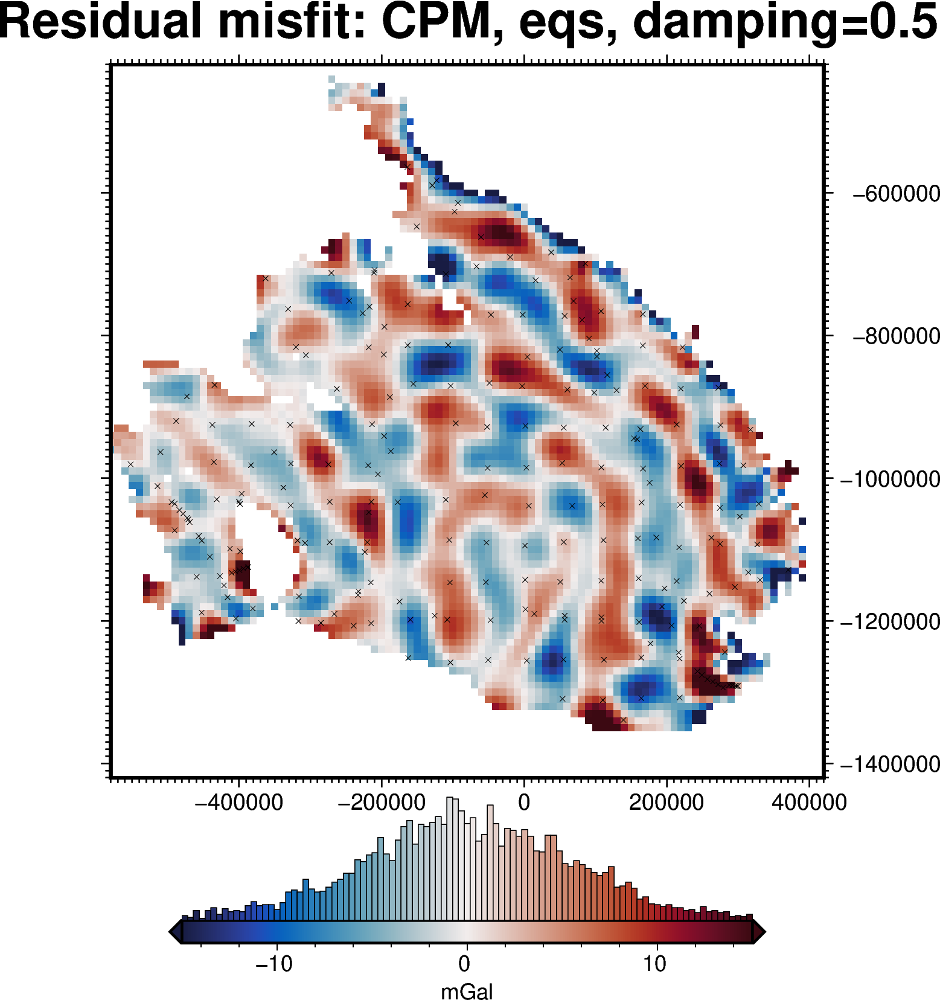

In [253]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# maxabs = vd.maxabs(polar_utils.get_min_max(grav_grid.res, robust=True))
maxabs = min(np.abs(polar_utils.get_min_max(grav_grid.res, robust=True)))
cpt_lims = [-maxabs, maxabs]
fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig_height=10,
    title="Residual misfit: CPM, eqs, damping=0.5",
    cmap="balance+h0",
    # cpt_lims=cpt_lims,
    cpt_lims=[-15, 15],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraints[constraints.inside],
    points_style="x.1c",
    points_pen=".1p",
)
fig.show()

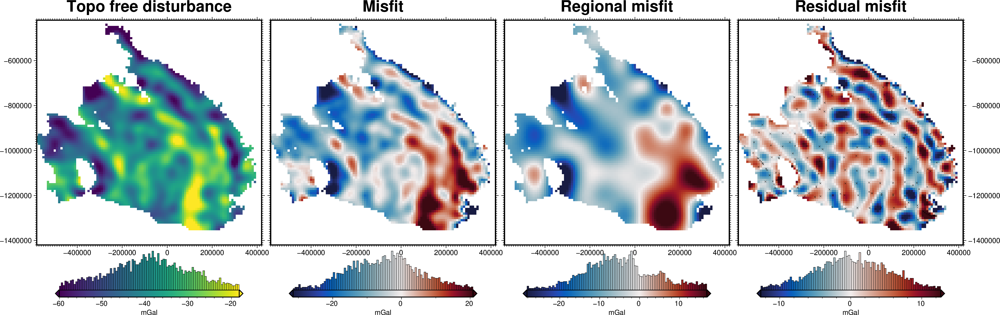

In [254]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Topo free disturbance",
    cmap="viridis",
    hist=True,
    robust=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    robust=True,
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    robust=True,
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
)

# maxabs = vd.maxabs(polar_utils.get_min_max(grav_grid.res, robust=True))
maxabs = min(np.abs(polar_utils.get_min_max(grav_grid.res, robust=True)))
cpt_lims = [-maxabs, maxabs]
fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=cpt_lims,
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraints[constraints.inside],
    points_style="x.1c",
    points_pen=".1p",
)
fig.show()

In [186]:
# print("number of test points: ", len(grav_df[grav_df.test]))
# print("number of train points: ", len(grav_df[~grav_df.test]))
print("number of total points: ", len(grav_df))

number of total points:  4775


# Constraints grid


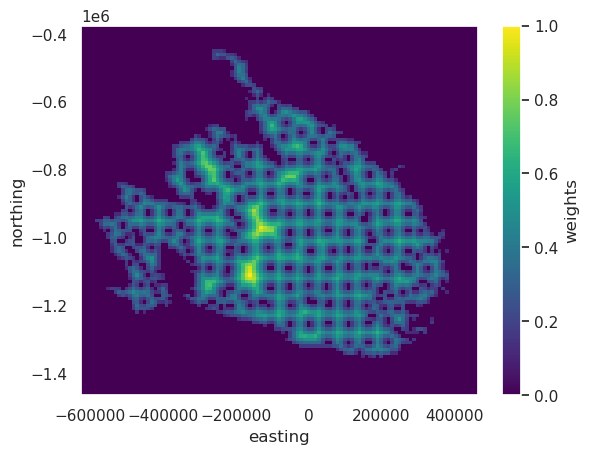

In [255]:
min_dist = utils.normalized_mindist(
    constraints,
    starting_bed_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_bed_prisms["weights"] = min_dist
starting_bed_prisms.weights.plot()

# Inversion

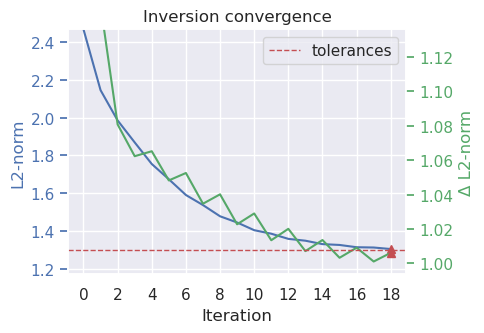

In [260]:
logging.getLogger().setLevel(logging.WARN)

# set kwargs for inversion
kwargs = dict(
    max_iterations=100,
    l2_norm_tolerance=1.3,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.008,  # stop if l2-norm doesn't decrease by at least 1%
)

# run the inversion workflow, including a cross validation for the damping parameter
inversion_results = inversion.run_inversion(
    grav_df=grav_df,  # [~grav_df.test],
    solver_damping=0.01,
    results_fname="../../results/RIS_inversion",
    prism_layer=starting_bed_prisms,
    plot_dynamic_convergence=True,
    upper_confining_layer=icebase_layer_spacing,
    **kwargs,
)

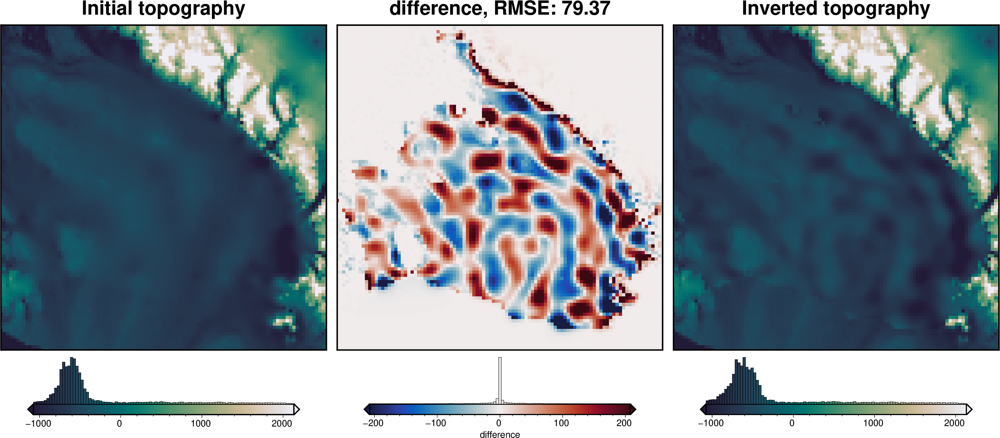

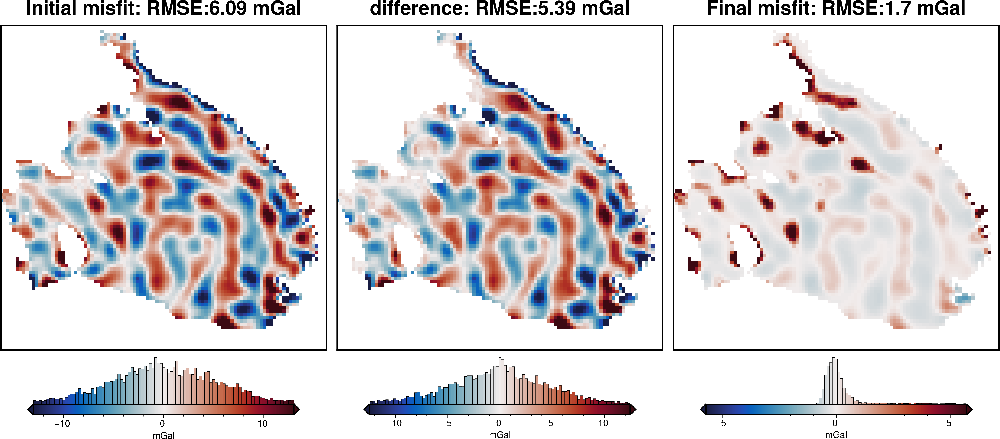

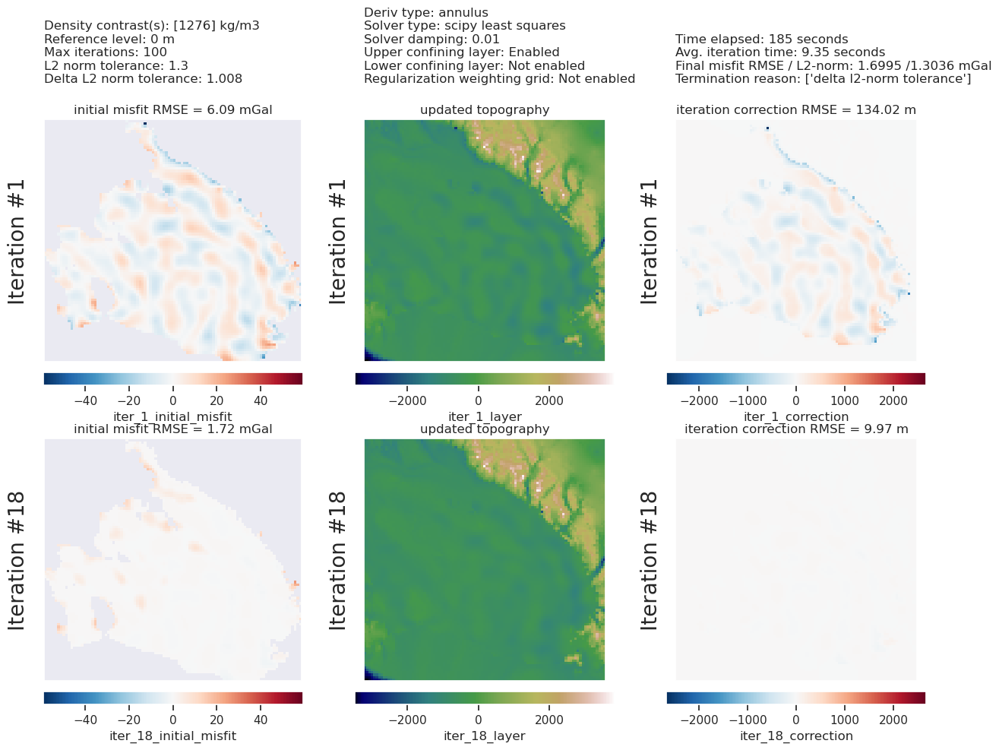

In [261]:
# collect the results
topo_results, grav_results, parameters, elapsed_time = inversion_results

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

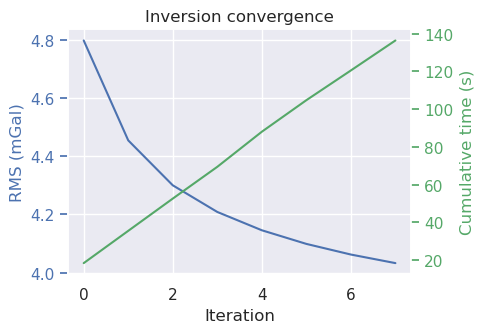

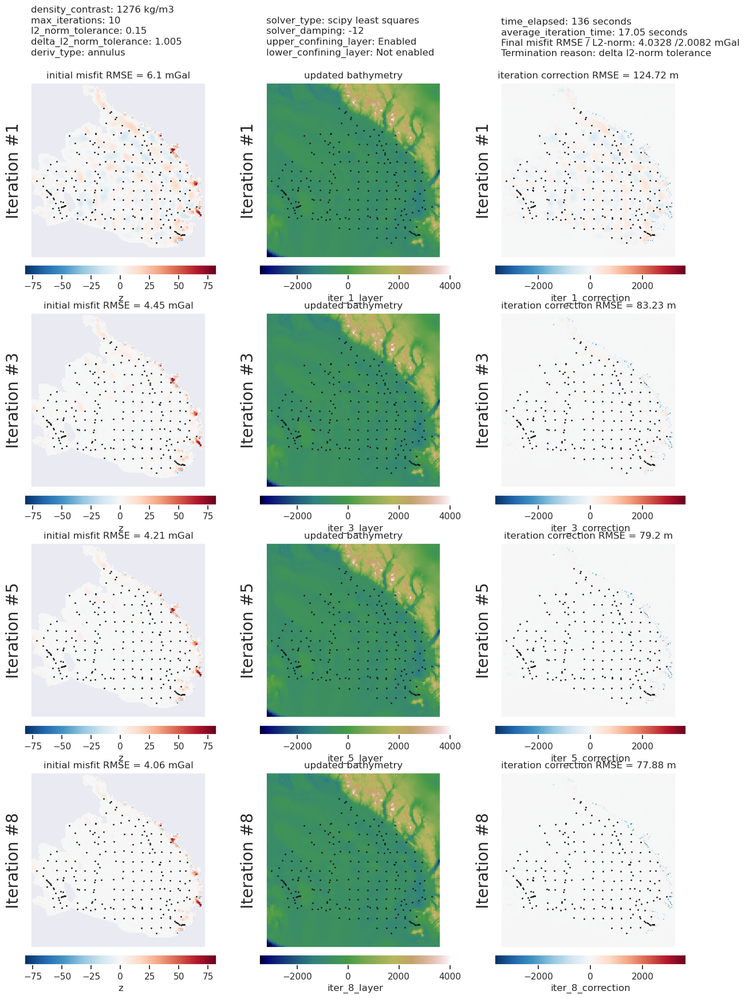

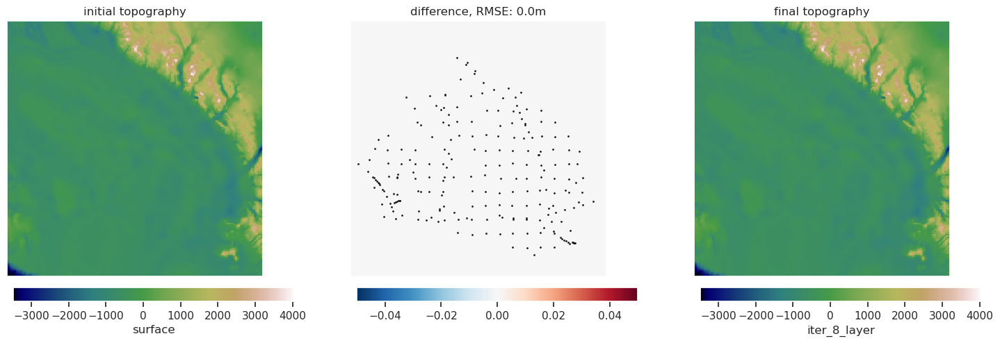

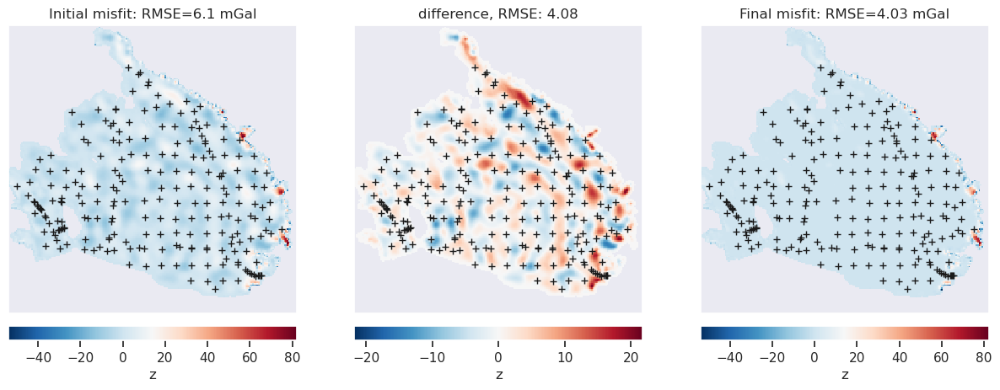

In [12]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_anomalies[~df_anomalies.test],
        inversion_region=inversion_region,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j-.6c/.3c",
        title_font="16p,Helvetica-Bold,black",
        constraints=constraints[constraints.inside],
        **kwargs,
    )

plotting.plot_convergence(inv_result[1], iter_times=inv_result[2]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[1],
    inv_result[0],
    inv_result[2],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints[constraints.inside],
    robust=True,
)

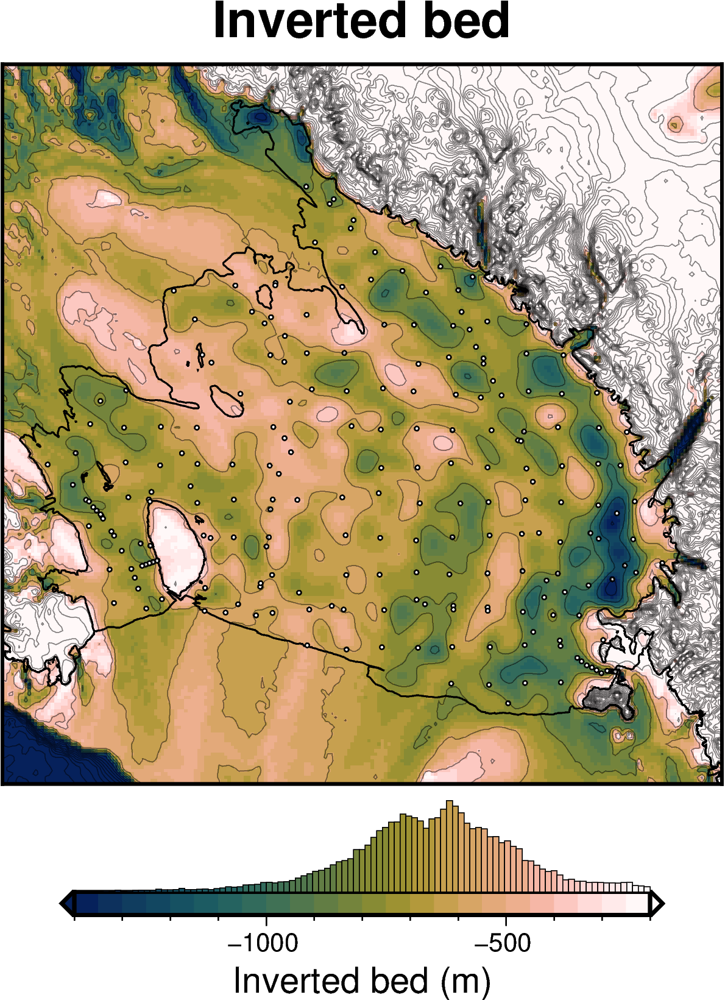

In [13]:
ds = inv_result[0].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[0].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

lims = [-1400, -200]
pygmt.grd2cpt(
    grid=final_bed,
    cmap="batlowW",
    # reverse=True,
    limit=lims,
    nlevels=25,  # background=True,
    output="../../plotting/tmp.cpt",
)

fig = maps.plot_grd(
    final_bed,
    fig_height=10,
    coast=True,
    coast_version="measures-v2",
    region=buffer_region,
    # cmap="rain",
    cmap="../../plotting/tmp.cpt",
    # reverse_cpt=True,
    title="Inverted bed",
    # title="Inverted bed (verde Spline)",
    # title="Inverted bed (GMT surface)",
    # grd2cpt=True,
    # cpt_lims=[-1500, 0],
    cpt_lims=lims,
    cbar_label="Inverted bed (m)",
    hist=True,
    cbar_yoffset=1.5,
    # shading=True,
)
fig.plot(
    x=constraints[constraints.inside].easting,
    y=constraints[constraints.inside].northing,
    style="c.06c",
    fill="white",
    pen=".5p,black",
)
fig.grdcontour(
    grid=final_bed,
    interval=200,
    annotation=None,
    transparency=50,
)

fig.show()

# Damping Cross-Validation

In [14]:
np.logspace(-6, 0, 10)

array([1.00000000e-06, 4.64158883e-06, 2.15443469e-05, 1.00000000e-04,
       4.64158883e-04, 2.15443469e-03, 1.00000000e-02, 4.64158883e-02,
       2.15443469e-01, 1.00000000e+00])

Damping values: [1.00000000e-06 4.64158883e-06 2.15443469e-05 1.00000000e-04
 4.64158883e-04 2.15443469e-03 1.00000000e-02 4.64158883e-02
 2.15443469e-01 1.00000000e+00]


Hyperparameter:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

  0%|                                                 | 0/64435 [00:00<?, ?it/s]

Best score of 3.59722195414519 with Hyperparameter=0.01
Best score: 3.59722195414519
Best damping: 0.01


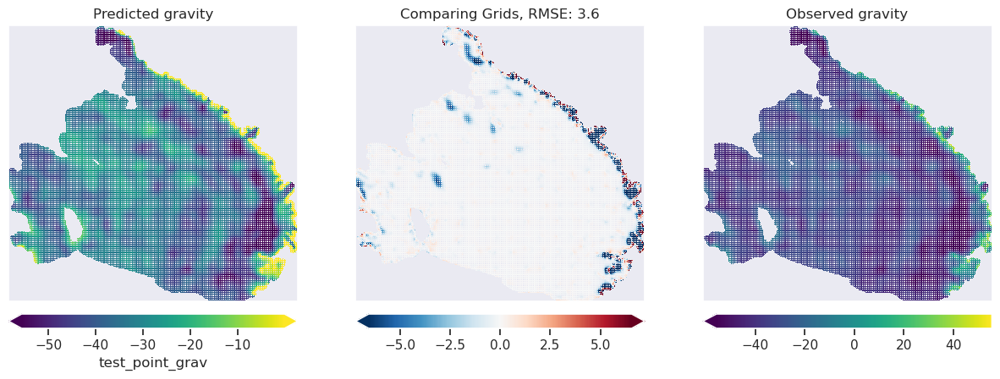

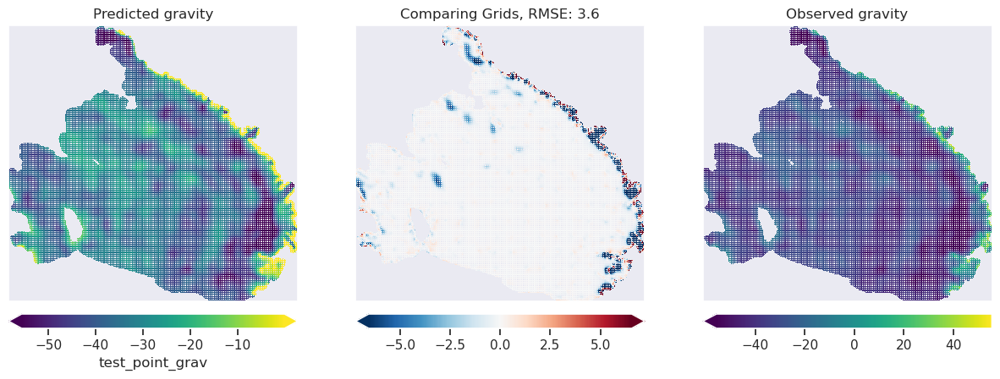

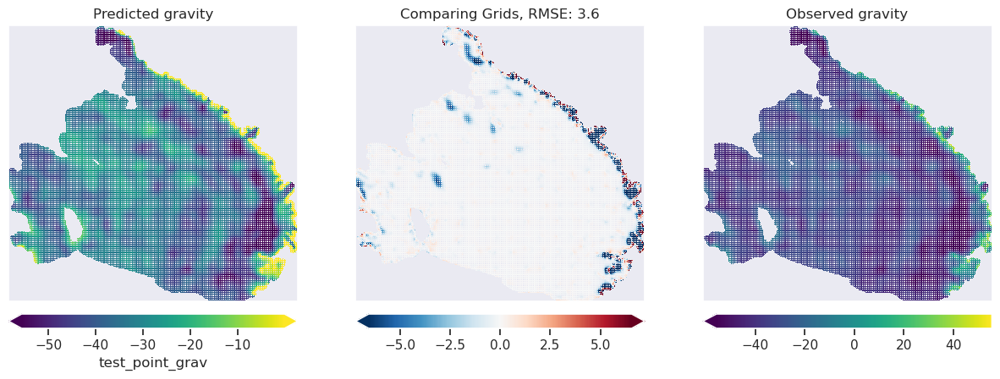

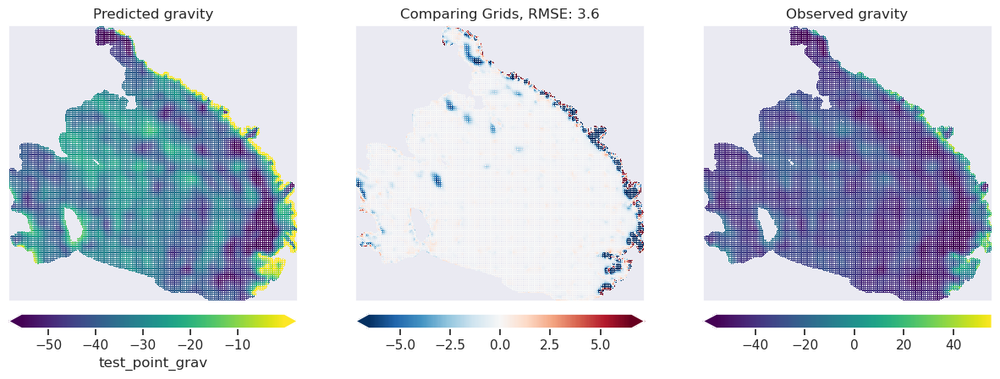

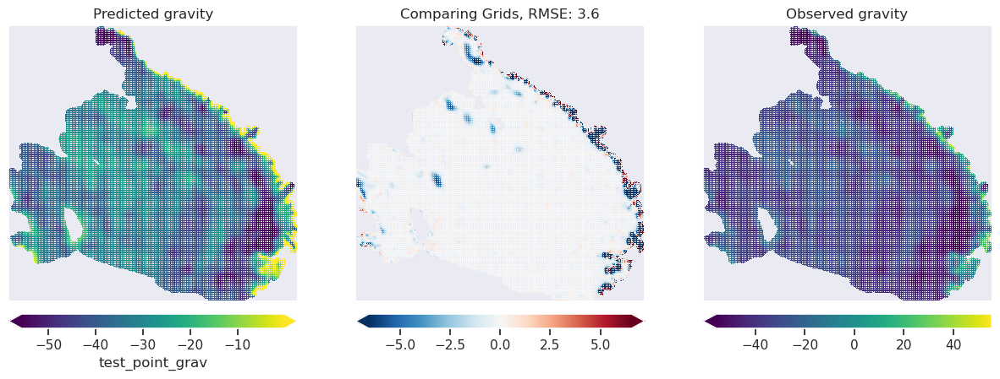

...

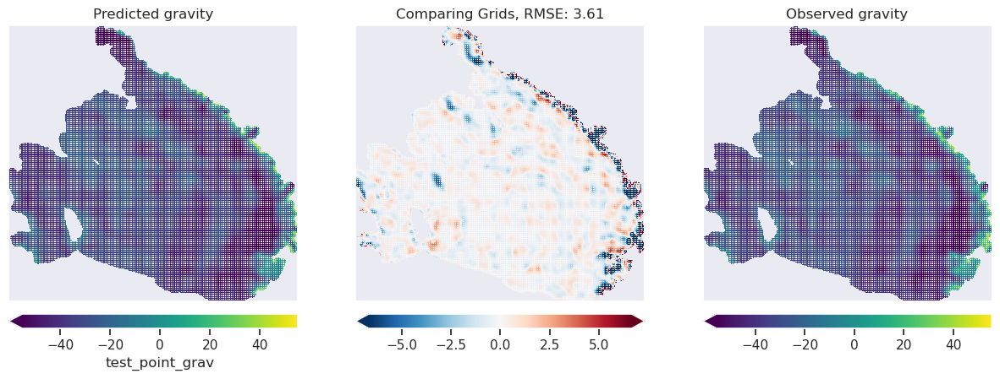

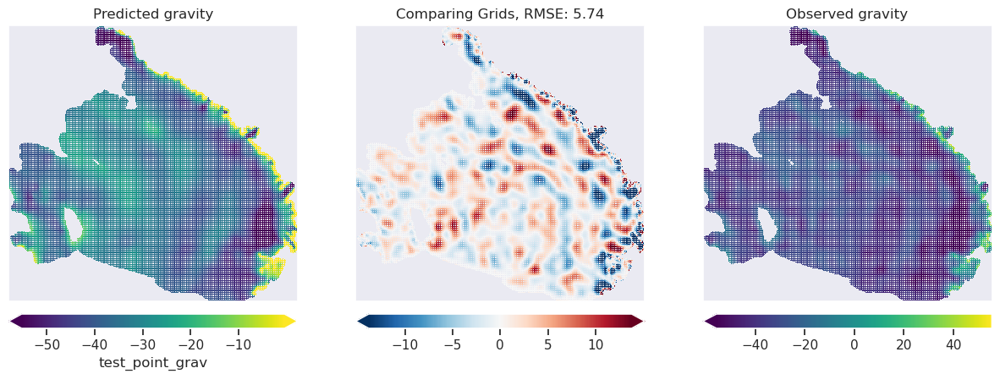

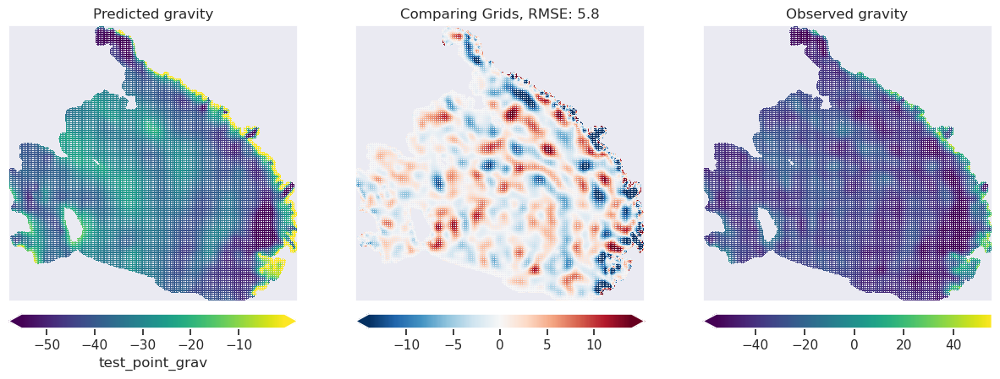

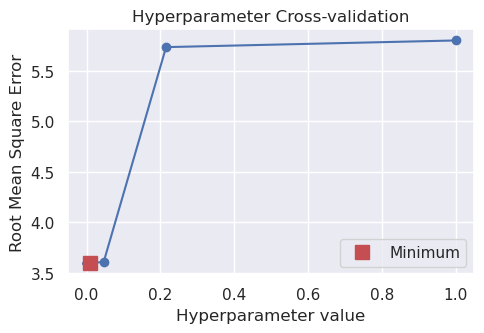

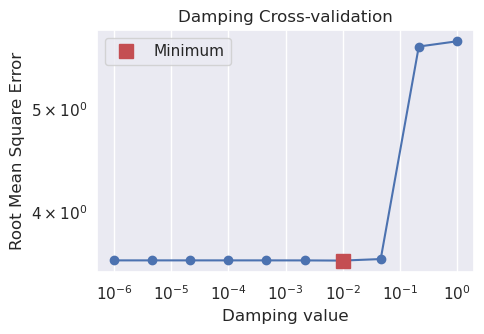

In [ ]:
# set kwargs for inversion
kwargs = dict(
    input_grav_column="partial_topo_corrected_disturbance",
    prism_layer=starting_bed_prisms,
    max_iterations=50,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.005,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    upper_confining_layer=icebase_layer_spacing,
)

fname = "../../results/RIS_damping_CV_mean_bed"
# fname = "../../results/RIS_damping_CV_verde_spline"
# fname = "../../results/RIS_damping_CV_gmt_surface"

dampings = np.logspace(-6, 0, 10)
# dampings = [10**-3, 10**-2]
print(f"Damping values: {dampings}")

scores, rmses = inv.inversion_optimal_parameters(
    training_data=df_anomalies[~df_anomalies.test],
    testing_data=df_anomalies[df_anomalies.test],
    parameter_values=dampings,
    function=inv.inversion_damping_MSE,
    # plot = True,
    plot_grids=True,
    results_fname=fname,
    progressbar=True,
    inversion_region=inversion_region,
    **kwargs,
)

# put scores and damping values into dict
CV_results = dict(scores=scores, dampings=dampings, rmses=rmses)

# remove if exists
pathlib.Path(f"{fname}.pickle").unlink(missing_ok=True)

# save scores and dampings to pickle
with Path.open(f"{fname}.pickle", "wb") as f:
    pickle.dump(CV_results, f)

# load scores and dampings from pickle
with Path.open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with Path.open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

# delete other results to save space
fnames = []
for i in range(len(dampings)):
    if i == best:
        pass
    else:
        fnames.append(f"{fname}_trial_{i}.pickle")
for f in fnames:
    pathlib.Path(f).unlink(missing_ok=True)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)
CV_results

# save prism results to zarr
ds = inv_result[0].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[0].columns.to_list() if "_layer" in s]
ds = ds.rename({cols[-1]: "final_bed"})

enc = {x: {"compressor": zarr.Blosc()} for x in ds}
ds.to_zarr(
    "../../results/RIS_inverted_bed.zarr",
    encoding=enc,
    mode="w",
)

In [20]:
# save grav results to zarr
ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
# cols = [s for s in inv_result[0].columns.to_list() if "_layer" in s]
# ds = ds.rename({cols[-1]:"final_bed"})

enc = {x: {"compressor": zarr.Blosc()} for x in ds}
ds.to_zarr(
    "../../results/RIS_inverted_bed_grav_results.zarr",
    encoding=enc,
    mode="w",
)

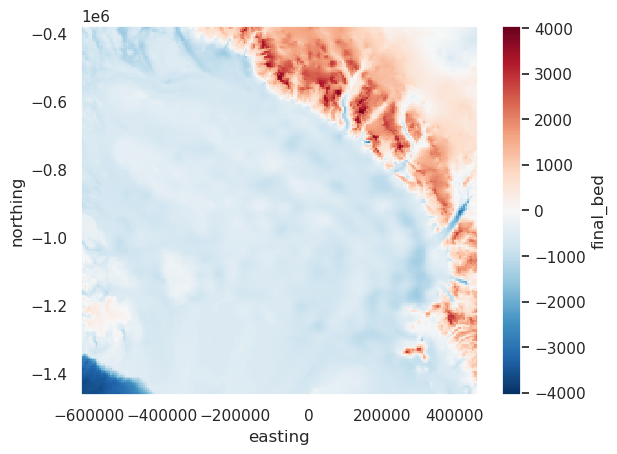

In [21]:
final_bed = xr.open_zarr("../../results/RIS_inverted_bed.zarr").final_bed
final_bed.plot()

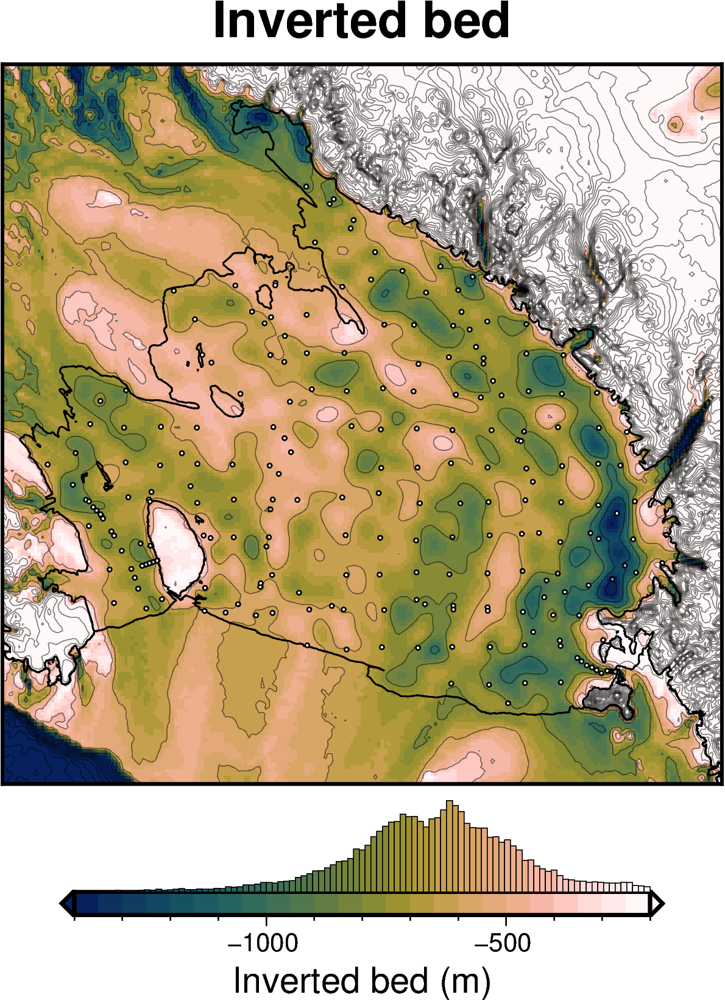

In [22]:
ds = inv_result[0].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[0].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

lims = [-1400, -200]
pygmt.grd2cpt(
    grid=final_bed,
    cmap="batlowW",
    # reverse=True,
    limit=lims,
    nlevels=25,  # background=True,
    output="../../plotting/tmp.cpt",
)

fig = maps.plot_grd(
    final_bed,
    fig_height=10,
    coast=True,
    coast_version="measures-v2",
    region=buffer_region,
    # cmap="rain",
    cmap="../../plotting/tmp.cpt",
    # reverse_cpt=True,
    title="Inverted bed",
    # title="Inverted bed (verde Spline)",
    # title="Inverted bed (GMT surface)",
    # grd2cpt=True,
    # cpt_lims=[-1500, 0],
    cpt_lims=lims,
    cbar_label="Inverted bed (m)",
    hist=True,
    cbar_yoffset=1.5,
    # shading=True,
)
fig.plot(
    x=constraints[constraints.inside].easting,
    y=constraints[constraints.inside].northing,
    style="c.06c",
    fill="white",
    pen=".5p,black",
)
fig.grdcontour(
    grid=final_bed,
    interval=200,
    annotation=None,
    transparency=50,
)

fig.show()

In [23]:
points = profiles.sample_grids(
    constraints[constraints.inside],
    final_bed,
    "sampled_bed",
    coord_names=["easting", "northing"],
)
points["dif"] = points.upward - points.sampled_bed
rmse = utils.RMSE(points.dif)
rmse

15.713531107424634

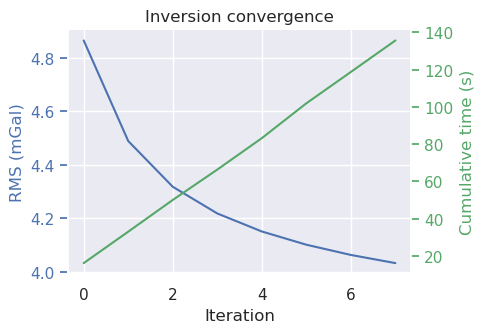

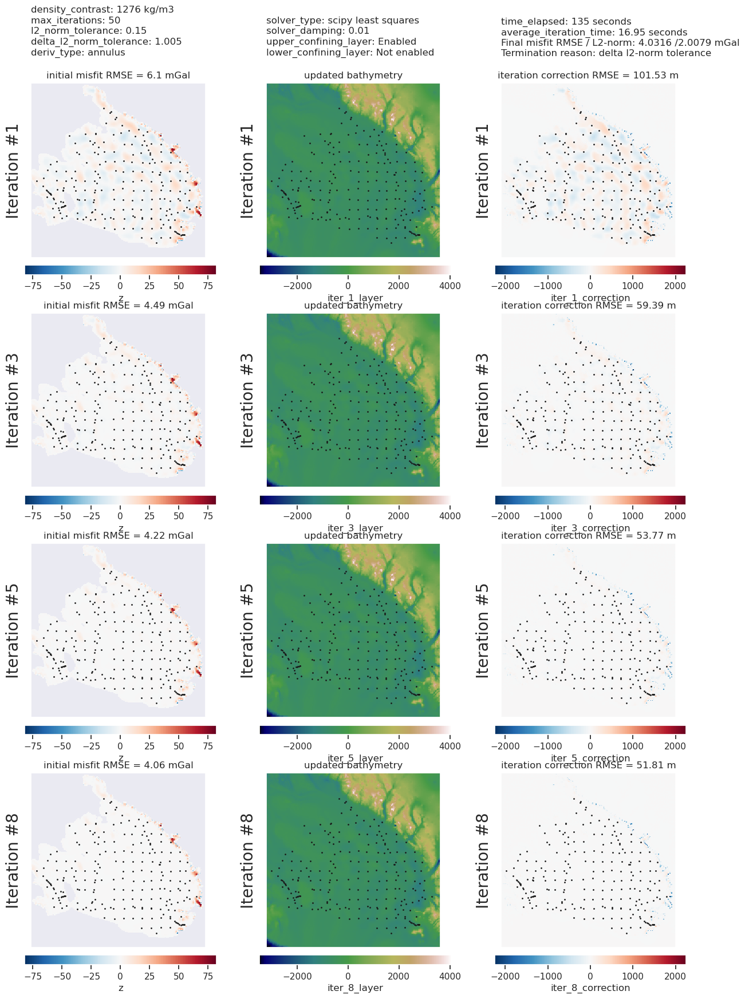

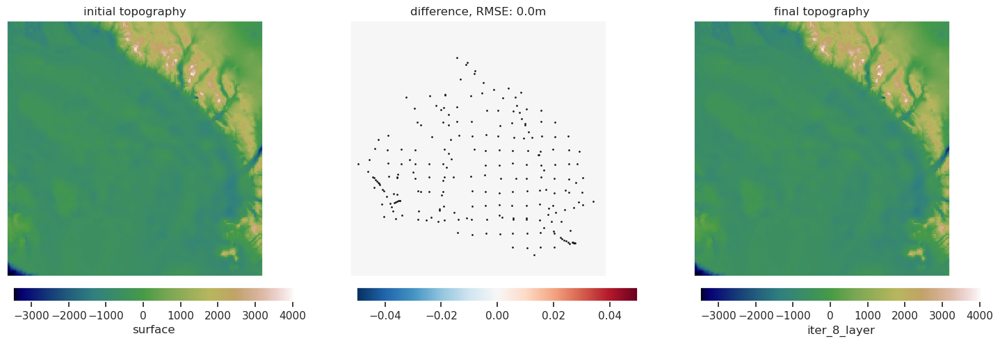

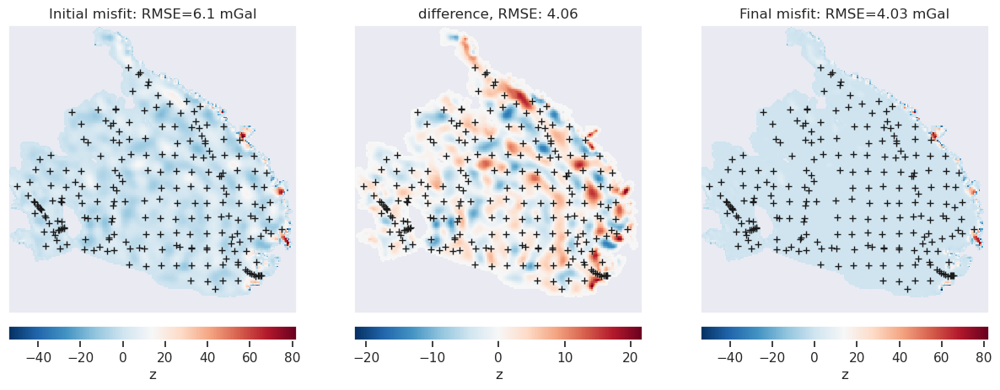

In [24]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_anomalies[df_anomalies.test == False],
        inversion_region=inversion_region,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j-.6c/.3c",
        title_font="16p,Helvetica-Bold,black",
        constraints=constraints[constraints.inside],
        **kwargs,
    )

plotting.plot_convergence(inv_result[1], iter_times=inv_result[2]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[1],
    inv_result[0],
    inv_result[2],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints[constraints.inside],
)

In [25]:
df_anomalies.describe()

,northing,easting,upward,Gobs,ice_surface_grav,water_surface_grav,starting_bed_grav,partial_topo_corrected_disturbance,misfit,reg,res
count,8.591400e+04,85914.000000,85914.0,85914.000000,85914.000000,85914.000000,85914.000000,85914.000000,85914.000000,85914.000000,85914.000000
mean,-9.807940e+05,-68355.244780,1000.0,-41.635424,0.408694,-1.813703,-34.632924,-40.230416,-5.597492,-6.007341,0.409849
std,1.972713e+05,240977.452181,0.0,12.642947,3.026426,0.826801,11.404587,13.100643,18.028138,17.471707,5.865073
min,-1.365000e+06,-580000.000000,1000.0,-222.110615,-13.612121,-5.920126,-71.203652,-222.023617,-168.856796,-143.524001,-53.431386
25%,-1.140000e+06,-250000.000000,1000.0,-48.041755,-0.555447,-2.147006,-40.287556,-46.615006,-12.514437,-11.360050,-2.159865
50%,-9.925000e+05,-62500.000000,1000.0,-40.820589,-0.312206,-1.732367,-35.468362,-39.257963,-3.856370,-3.799498,0.004364
75%,-8.400000e+05,125000.000000,1000.0,-34.323489,0.340173,-1.538939,-30.573363,-32.639919,4.450478,3.291219,2.218660
max,-4.250000e+05,405000.000000,1000.0,1.997854,36.591922,4.137666,47.834677,-4.433789,36.900787,36.448793,82.099716


## Compare with Bedmap2

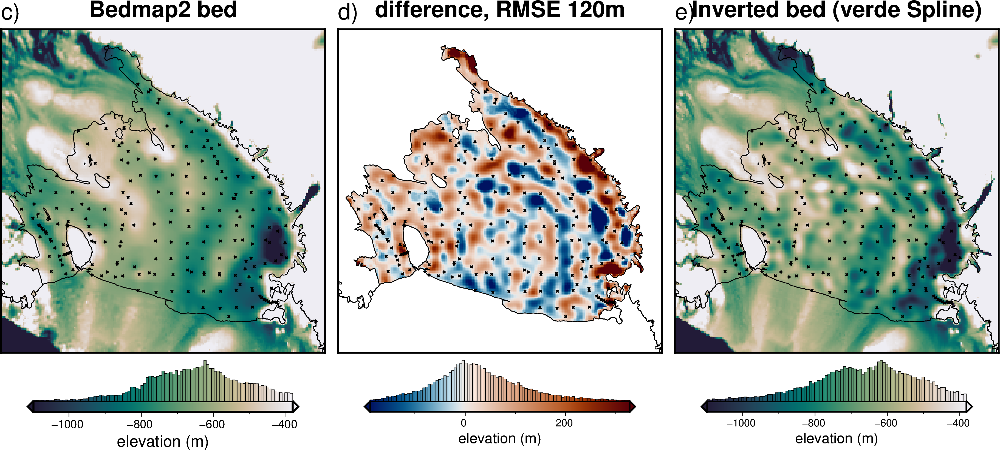

In [26]:
ds = inv_result[0].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[0].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

masked_final_bed = utils.mask_from_shp(
    "../../plotting/RIS_outline.shp",
    xr_grid=final_bed,
    masked=True,
    invert=False,
)
masked_bedmap_bed = utils.mask_from_shp(
    "../../plotting/RIS_outline.shp",
    xr_grid=bedmap_bed,
    masked=True,
    invert=False,
)
masked_dif = masked_bedmap_bed - masked_final_bed
rmse = inv_utils.RMSE(masked_dif)

# set color limits
lims = utils.get_min_max(
    masked_final_bed,
    "../../plotting/RIS_outline.shp",
    robust=True,
)

dif = bedmap_bed - final_bed

fig = maps.plot_grd(
    bedmap_bed,
    fig_height=10,
    cmap="rain",
    coast=True,
    coast_version="measures-v2",
    reverse_cpt=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x0.1c",
    title="Bedmap2 bed",
    cbar_label="elevation (m)",
    cpt_lims=lims,
    robust=True,
    hist=True,
    cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="20p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig = maps.plot_grd(
    masked_dif,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    cmap="vik+h0",
    coast=True,
    coast_version="measures-v2",
    points_style="x0.1c",
    hist=True,
    cbar_yoffset=1.5,
    title=f"difference, RMSE {int(rmse)}m",
    cbar_label="elevation (m)",
    robust=True,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="d)",
    font="20p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig = maps.plot_grd(
    final_bed,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    cmap="rain",
    coast=True,
    coast_version="measures-v2",
    reverse_cpt=True,
    points_style="x0.1c",
    hist=True,
    cbar_yoffset=1.5,
    title="Inverted bed (verde Spline)",
    # title="Inverted bed (GMT surface)",
    cbar_label="elevation (m)",
    cpt_lims=lims,
    robust=True,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="e)",
    font="20p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig.show()

## Compare with starting

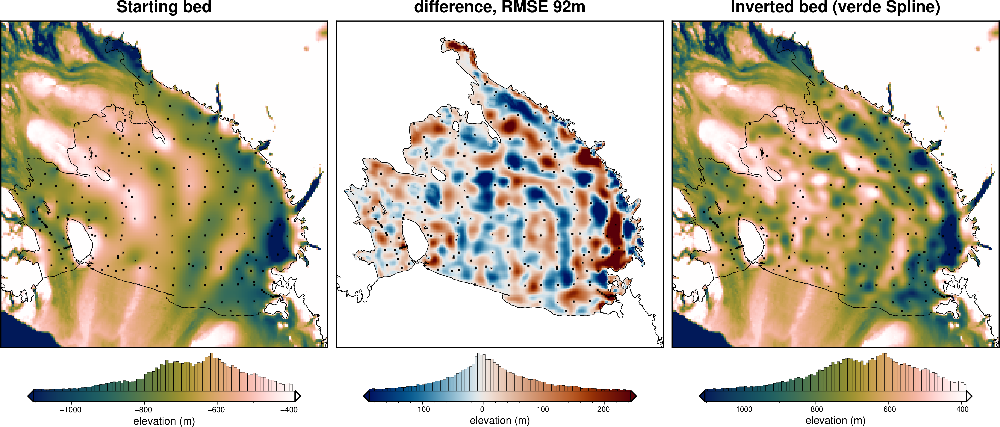

In [54]:
ds = inv_result[0].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[0].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

masked_final_bed = utils.mask_from_shp(
    "../../plotting/RIS_outline.shp",
    xr_grid=final_bed,
    masked=True,
    invert=False,
)
masked_bedmachine_bed = utils.mask_from_shp(
    "../../plotting/RIS_outline.shp",
    xr_grid=bedmachine_bed,
    masked=True,
    invert=False,
)
masked_dif = masked_bedmachine_bed - masked_final_bed
rmse = inv_utils.RMSE(masked_dif)

# set color limits
lims = utils.get_min_max(
    masked_final_bed,
    "../../plotting/RIS_outline.shp",
    robust=True,
)

dif = starting_bed - final_bed

fig = maps.plot_grd(
    starting_bed,
    cmap="batlowW",
    coast=True,
    coast_version="measures-v2",
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x0.1c",
    title="Starting bed",
    cbar_label="elevation (m)",
    cpt_lims=lims,
    robust=True,
    hist=True,
)
fig = maps.plot_grd(
    masked_dif,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    cmap="vik+h0",
    coast=True,
    coast_version="measures-v2",
    points_style="x0.1c",
    hist=True,
    title=f"difference, RMSE {int(rmse)}m",
    cbar_label="elevation (m)",
    robust=True,
    fig=fig,
    origin_shift="xshift",
)
fig = maps.plot_grd(
    final_bed,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    cmap="batlowW",
    coast=True,
    coast_version="measures-v2",
    points_style="x0.1c",
    hist=True,
    title="Inverted bed (verde Spline)",
    # title="Inverted bed (GMT surface)",
    cbar_label="elevation (m)",
    cpt_lims=lims,
    robust=True,
    fig=fig,
    origin_shift="xshift",
)

fig.show()

## Compare with Bedmachine

In [ ]:
ds = inv_result[0].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[0].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

masked_final_bed = utils.mask_from_shp(
    "../../plotting/RIS_outline.shp",
    xr_grid=final_bed,
    masked=True,
    invert=False,
)
masked_bedmachine_bed = utils.mask_from_shp(
    "../../plotting/RIS_outline.shp",
    xr_grid=bedmachine_bed,
    masked=True,
    invert=False,
)
masked_dif = masked_bedmachine_bed - masked_final_bed
rmse = inv_utils.RMSE(masked_dif)

# set color limits
lims = utils.get_min_max(
    masked_final_bed,
    "../../plotting/RIS_outline.shp",
    robust=True,
)

dif = bedmachine_bed - final_bed

fig = maps.plot_grd(
    bedmachine_bed,
    cmap="rain",
    coast=True,
    coast_version="measures-v2",
    reverse_cpt=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x0.1c",
    title="Bedmachine bed",
    cbar_label="elevation (m)",
    cpt_lims=lims,
    robust=True,
    hist=True,
)
fig = maps.plot_grd(
    dif,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    cmap="vik+h0",
    coast=True,
    coast_version="measures-v2",
    points_style="x0.1c",
    hist=True,
    title=f"difference, RMSE {int(rmse)}m",
    cbar_label="elevation (m)",
    robust=True,
    fig=fig,
    origin_shift="xshift",
)
fig = maps.plot_grd(
    final_bed,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    cmap="rain",
    coast=True,
    coast_version="measures-v2",
    reverse_cpt=True,
    points_style="x0.1c",
    hist=True,
    title="Inverted bed (verde Spline)",
    # title="Inverted bed (GMT surface)",
    cbar_label="elevation (m)",
    cpt_lims=lims,
    robust=True,
    fig=fig,
    origin_shift="xshift",
)

fig.show()

# Timing and profiles

In [ ]:
# set kwargs for inversion
kwargs = dict(
    input_grav_column="partial_topo_corrected_disturbance",
    prism_layer=starting_bed_prisms,
    max_iterations=50,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    solver_damping=10 ^ -2,
    plot_convergence=True,
    upper_confining_layer=icebase_layer_spacing,
)

In [ ]:
%%prun -q -T results/profiling.txt -D results/profiling-raw.dat
# with inv_utils.HiddenPrints():
inv_result = inv.geo_inversion(
    input_grav=df_anomalies[df_anomalies.test == False],
    **kwargs,
)

In [ ]:
!head -n 20 results/profiling.txt

In [ ]:
import pstats


def filter_profiling(keys, fname):
    output = f"../../results/{fname}"
    with Path.open(output, "w") as f:
        # Load the profiling data and set the output file
        st = pstats.Stats("../../results/profiling-raw.dat", stream=f)
        # Filter the data to isolate the time in the desired
        # function and print to the file
        st.sort_stats("cumtime").reverse_order().print_stats(*keys)
    # Print the file contents
    !cat $output

In [ ]:
filter_profiling(["scipy", "sparse", "lsqr"], "profiling-linsys.txt")

In [ ]:
filter_profiling(["numpy", "dot"], "profiling-dot.txt")

In [ ]:
filter_profiling(["harmonica", "jit_prism_gravity"], "profiling-forward.txt")

In [ ]:
keys = "forward dot linsys".split()
times = {}
total_times = []
for k in keys:
    with Path.open(f"../../results/profiling-{k}.txt") as f:
        lines = f.readlines()
    times[k] = float(lines[-3].strip().split()[3])
    total_times.append(float(lines[2].strip().split()[-2]))
# Check if all total execution times read are equal
assert np.all(np.equal(total_times[0], total_times))
total_time = total_times[0]

total_time, times

In [ ]:
percentage = {k: 100 * times[k] / total_time for k in keys}

for k in keys:
    print(f"{k} = {percentage[k]:.5f} %")

In [ ]:
tmp = !cat /proc/cpuinfo | grep "model name"
processor = tmp[0].split(":")[1].strip()
print(processor)

In [ ]:
caption = f"""
        Time spent on each function during a single inversion of
        Ross Ice Shelf bathymetry.
        The inversion was performed on a computer with a
        {processor} processor.
        The total time for the inversion was {total_time:.3f} seconds.
"""
print(caption)

In [ ]:
line = "{func} & {time:.3f} & {percent:.3f}"
lsqr = line.format(
    func="Sparse LSQR", time=times["linsys"], percent=percentage["linsys"]
)
dot = line.format(
    func="Sparse dot product", time=times["dot"], percent=percentage["dot"]
)
fwd = line.format(
    func="Prism forward modeling", time=times["forward"], percent=percentage["forward"]
)
lsqr, dot, fwd

In [ ]:
table = f"""
\begin{{table}}
    \\centering
    \\caption{caption}
    \\label{{profiling}}
    \begin{{tabular}}{{lcc}}
        Function description & Time (s) & Percentage of total time (\\%)\\
        \\hline
        {lsqr}\\
        {dot}\\
        {fwd}\\
        \\hline
    \\end{{tabular}}
\\end{{table}}
"""
print(table)